# Практическое задание 1

**Правила**

* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds24_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. **Работы, присланные иным способом, не принимаются.**
* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.

**Особенности**
* Рассчитано на **пять недель**.
* Состоит из **четырех частей**. Две из них посвящены обучению CV моделей, а две других применению этих моделей к реальным данным.
* Разделено на **два блока**: 1-2 части и 3-4 части. Блоки **не зависят друг от друга**.
* Задание большое, и сделать его в последний момент не получится. Поэтому сдача происходит *(почти)* **каждую неделю**.
* В вашем решении, которое вы сдаете в определенную неделю, в самом начале ноутбука должно быть указано, что было сделано за эту неделю. При этом за каждую сдачу должно быть сделано не менее 10% задания, иначе будет применен штраф.
* Что означает "*(почти) каждую неделю*": у вас есть возможность **пропустить две недели** сдачи из пяти при следующих условиях:
    * **Нельзя пропускать первую неделю** (в первую неделю нужно обязательно сдать хотя бы 10 процентов)
    * **Нельзя пропускать две недели подряд** (то есть если ничего не сдавали на неделе $N$, на неделе $N + 1$ должны обязательно сдать хотя бы 10 процентов)
    * За несоблюдение любого из условий будет применен штраф
* В конце срока сдачи задания вам необходимо предоставить **полностью готовое решение** и отчет о том, что вы сделали **на каждой неделе**. Если не предоставить отчет, проверяющий может оценить объем по каждому дедлайну на свое усмотрение.
* Задание основано на датасетах в Kaggle. В датасетах обычно представлены ноутбуки с примером кода для обработки данных или даже обучения моделей. С ними может быть полезно ознакомиться, поучиться чему-то новому, и что-то применить для своего решения. Однако в случае заимствования в решении необходимо ссылаться на используемые ноутбуки. При этом **копирование бОльшей части кода без собственных комментариев и обновления кода будет штрафоваться**.

**Баллы**
* Часть 1 &mdash; 100 баллов
* Часть 2 &mdash; 50 баллов
* Часть 3 &mdash; 100 баллов + 20 бонусных баллов
* Часть 4 &mdash; 50 баллов
* 20 бонусных баллов за логировние процесса обучения в [Weights & Biases](https://wandb.ai/)
* Всего &mdash; $min(300, \text{набранная сумма баллов})$.

**Рекомендации по выполнению**
1. Начинайте выполнение задания как можно раньше.
2. "Съешьте на завтрак слона 🐘". Задание разделено на несколько независимых блоков: 1 и 2 части никак не связаны с 3 и 4 частями. Начните выполнение с той части, которая вам кажется наиболее сложной и непонятной.
3. В Kaggle 🎯 можно работать с ноутбуками и обучать модели. Здесь, возможно, будет удобнее чем в Google Colab, в особенности работа с данными.
___

In [1]:
!pip install ipywidgets
!pip install pytorch_lightning
!pip install wandb

In [126]:
# Утилиты стандартной библиотеки
from functools import lru_cache
import os
import copy
import re
import random
import shutil
from tqdm import tqdm
from urllib.request import urlretrieve
from pathlib import Path

# Библиотеки для анализа данных
import numpy as np
import sklearn.preprocessing
from sklearn.model_selection import train_test_split

# Библиотеки для обработки изображений
import cv2
from PIL import Image
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchvision.transforms import ToPILImage
import torchvision.transforms as T
import torch.optim as optim

import tensorflow as tf

# Библиотеки для визуализации
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
sns.set()

# Библиотеки для обучения
import pytorch_lightning as pl
import albumentations as A
from albumentations.pytorch import ToTensorV2
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import ModelCheckpoint
from skimage.morphology import dilation, footprint_rectangle

from glob import glob
from skimage.morphology import skeletonize
from sklearn.cluster import DBSCAN
import matplotlib.cm as cm
import matplotlib
from skimage.measure import label, regionprops
from shapely.geometry import LineString 
from shapely import simplify
from scipy.spatial.distance import cdist  # Исправленный импорт

# Утилита для tqdm в Jupyter Notebook
from tqdm.auto import tqdm

# Определение устройства
if torch.cuda.is_available():
    device = "cuda"
elif xm.xla_device() is not None:
    device = "xla"  # TPU
else:
    device = "cpu"

print(f"Using device: {device}")

import wandb

Using device: cuda


In [3]:
wandb.login(key="ca0f522a70ce0bd6b4a0aeb32424470b576c24d3")

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: demoren (demoren_mipt). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

## КАРТОГРАФИЯ И ДЕТЕКТИРОВАНИЕ ДОРОЖНЫХ ОБЪЕКТОВ 🚗🛣️🚦

В этом задании вам предстоит решить несколько задач, связанных с дорожной инфраструктурой! Вы научитесь распознавать дороги на спутниковых снимках, строить по ним графы дорожных сетей, детектировать и классифицировать объекты на дорогах. А в конце протестируете свои модели в реальных условиях Долгопрудного!


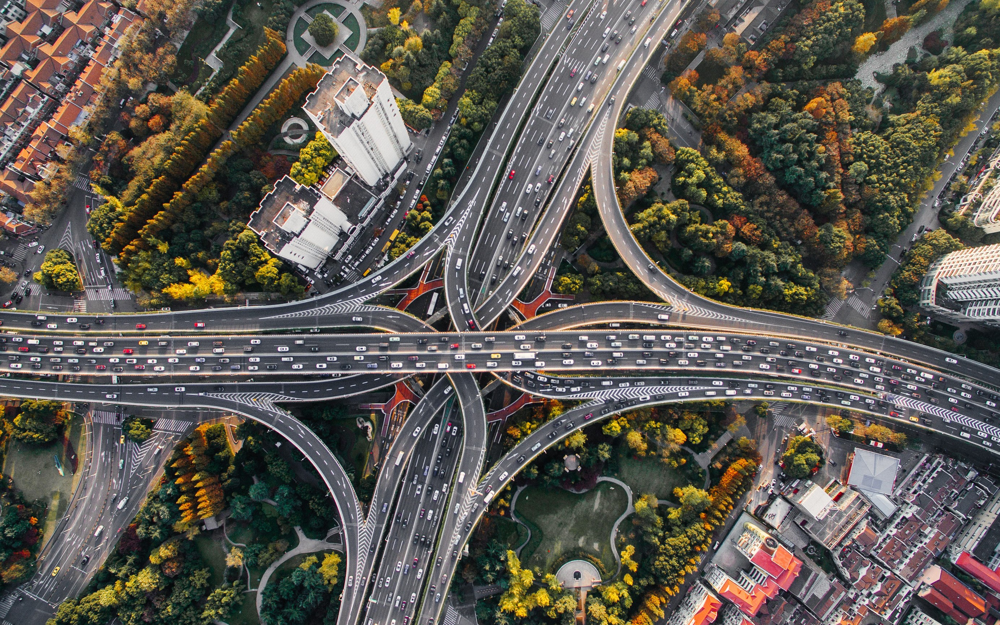

*Предисловие к 1 и 2 частям*

Задача автоматического распознавания дорог и построения графов дорожной сети по спутниковым снимкам имеет множество практических применений: от обновления картографических сервисов до планирования городской инфраструктуры и анализа транспортной доступности районов.

### Часть 1. Сегментация дорог на спутниковых снимках 🛰️

В этой части вам предстоит обучить модель сегментации дорог, которая сможет автоматически выделять дороги на спутниковых изображениях.

#### Этапы работы
1. **Подготовка данных.** Соберите коллекцию датасетов для обучения. Рекомендуется использовать несколько датасетов для повышения обобщающей способности модели. Можете рассмотреть следующие датасеты:
    - [DeepGlobe Road Extraction Dataset](https://www.kaggle.com/datasets/balraj98/deepglobe-road-extraction-dataset),
    - [Massachusetts Roads Dataset](https://www.kaggle.com/datasets/balraj98/massachusetts-roads-dataset),
    - [road_network_Detection_Mumbai_city_Dataset](https://www.kaggle.com/datasets/yash0309/road-network-detection-mumbai-city-dataset),
    - Любые другие подходящие датасеты по вашему выбору.

2. **Эксперименты с моделями.** Проведите различные эксперименты по обучению моделей, попробуйте разные архитектуры, например:
    - U-Net,
    - DeepLabV3,
    - Любые другие архитектуры по вашему выбору.

    Рекомендуется логировать все эксперименты с графиками лосса, метрик и примерами сгенерированных масок в удобной платформе, такой как [Weights & Biases](https://wandb.ai/). Это поможет лучше ориентироваться в экспериментах, сравнивать результаты и находить оптимальные параметры. За хорошо оформленное логирование 1 и 3 частей этого задания можно получить до 20 бонусных баллов (не забудьте прикрепить ссылку на проект и открыть к нему доступ).

3.  **Применение модели к Долгопрудному**
    - Скачайте спутниковые снимки части Долгопрудного (в частности, кампуса Физтеха) с Яндекс.Карт или других источников.
    - Разбейте изображение на части, примените модель сегментации к каждой части и соберите полученные маски обратно.
    - Вероятно у вас останутся "швы" на стыках масок. Попробуйте различные подходы, чтобы от них избавиться:
        * Перекрытие: Разбивайте изображение с небольшим перекрытием, а затем усредняйте маски в областях перекрытия.
        * Сглаживание: Используйте фильтры сглаживания (например, гауссовский) на краях масок.
        * Любые другие идеи, за вдохновением можно обращаться к LLM (например, к [DeepSeek](https://chat.deepseek.com)).


1. Начнем с подготовки датасетов.

In [4]:
H = 256
W = 256
BATCH_SIZE = 8
LEARNING_RATE = 1e-4
EPOCHS = 70

DATA_PATH = '/kaggle/input/deepglobe-road-extraction-dataset/train'

Основные метрики

Напишем функцию загрузки данных

In [5]:
def load_data(data_path, split=0.2):
    """Load and split data into train/val/test."""
    images = sorted(glob(data_path + '/*sat.jpg'))
    masks = sorted(glob(data_path + '/*mask.png'))

    # Splitting
    train_x, val_x = train_test_split(images, test_size=0.2, random_state=42)
    train_y, val_y = train_test_split(masks, test_size=0.2, random_state=42)
    
    train_x, test_x = train_test_split(train_x, test_size=0.2, random_state=42)
    train_y, test_y = train_test_split(train_y, test_size=0.2, random_state=42)
    
    return (train_x, train_y), (val_x, val_y), (test_x, test_y)

(train_x, train_y), (val_x, val_y), (test_x, test_y) = load_data(DATA_PATH)
print(f"Train size: {len(train_x)}, Val size: {len(val_x)}, Test size: {len(test_x)}")

Train size: 3984, Val size: 1246, Test size: 996


Получим датасеты

In [6]:
transform = transforms.Compose([
    transforms.Resize((H, W)),
    transforms.ToTensor()
])

class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        # Читаем изображение
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")  # ЧБ-маска

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask
        
BATCH_SIZE = 16

train_dataset = SegmentationDataset(train_x, train_y, transform=transform)
val_dataset = SegmentationDataset(val_x, val_y, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

for images, masks in train_loader:
    print(f"Images batch shape: {images.shape}")
    print(f"Masks batch shape: {masks.shape}")
    break

Images batch shape: torch.Size([16, 3, 256, 256])
Masks batch shape: torch.Size([16, 1, 256, 256])


Посмотрим, что лежит в батчах

Batch 60 - Images: torch.Size([16, 3, 256, 256]), Masks: torch.Size([16, 1, 256, 256])


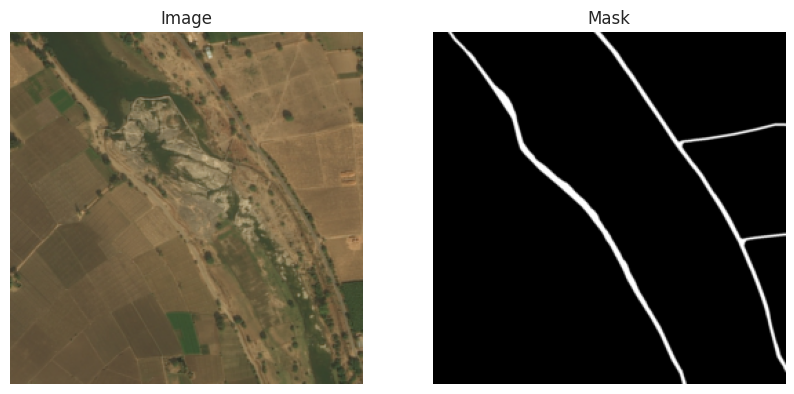

Batch 61 - Images: torch.Size([16, 3, 256, 256]), Masks: torch.Size([16, 1, 256, 256])


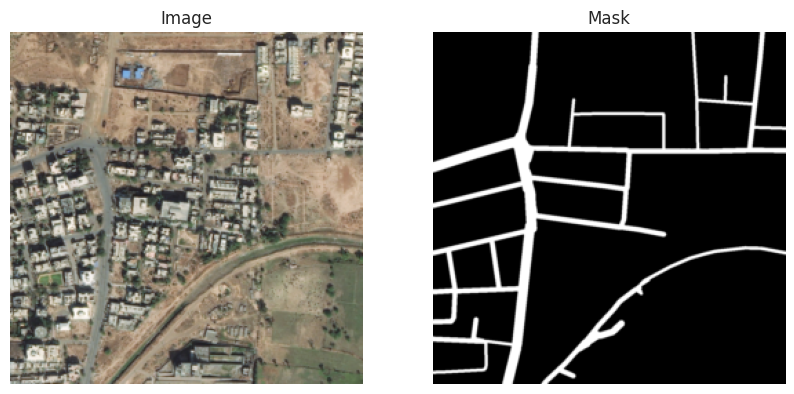

Batch 62 - Images: torch.Size([16, 3, 256, 256]), Masks: torch.Size([16, 1, 256, 256])


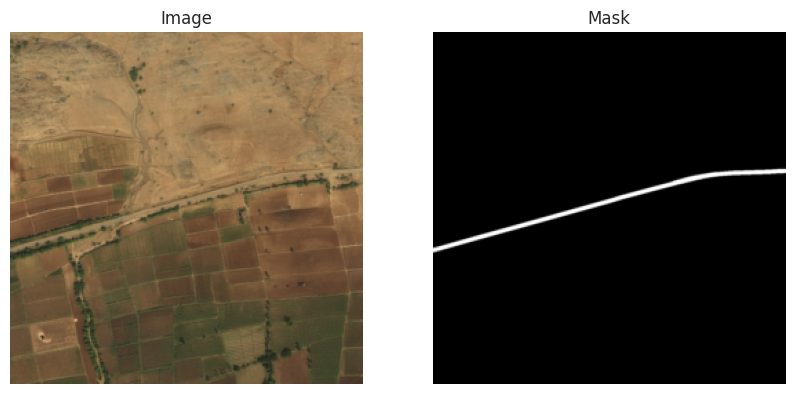

Batch 63 - Images: torch.Size([16, 3, 256, 256]), Masks: torch.Size([16, 1, 256, 256])


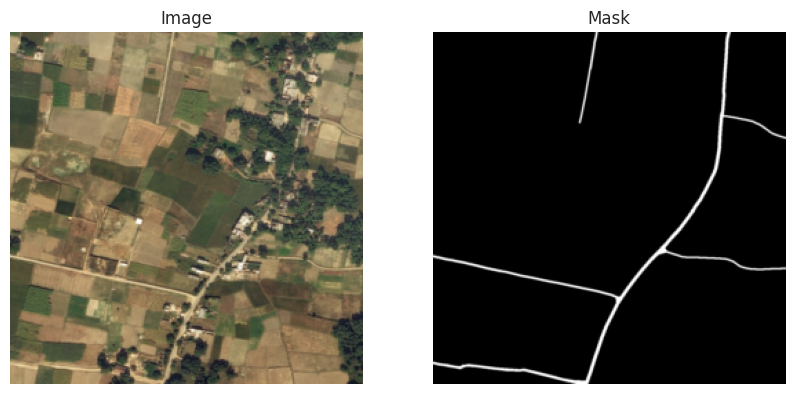

Batch 64 - Images: torch.Size([16, 3, 256, 256]), Masks: torch.Size([16, 1, 256, 256])


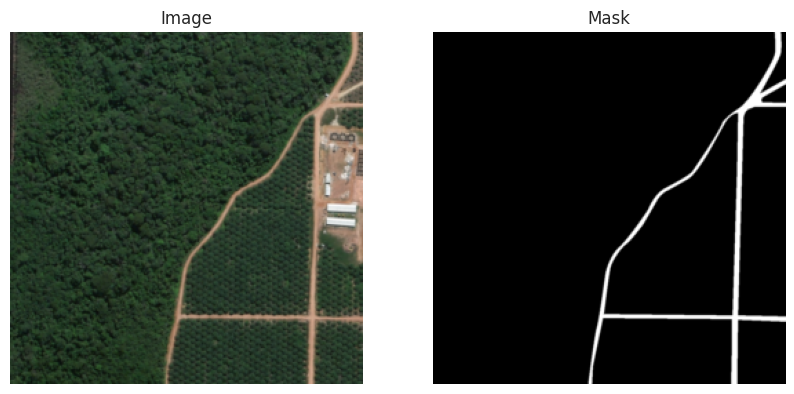

In [7]:
random_batch_index = random.randint(0, len(train_loader) - 6)

# Пропускаем случайное количество батчей и берём 5 подряд
for i, (images, masks) in enumerate(train_loader):
    if i < random_batch_index:
        continue  # Пропускаем до нужного индекса
    
    print(f"Batch {i} - Images: {images.shape}, Masks: {masks.shape}")

    # Отображаем первое изображение в батче
    img = images[0].permute(1, 2, 0).numpy()  # Перестановка размерностей в (H, W, C)
    mask = masks[0].squeeze().numpy()

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img)
    ax[0].set_title("Image")
    ax[0].axis("off")

    ax[1].imshow(mask, cmap="gray")
    ax[1].set_title("Mask")
    ax[1].axis("off")

    plt.show()

    # Останавливаемся после 5 батчей
    if i >= random_batch_index + 4:
        break


2. Датасет есть, теперь обучим модель UNet на нем.

In [8]:
smooth = 1e-15

def calculate_iou(pred_mask, true_mask, threshold=0.5):
    """
    Рассчитывает метрику IoU (Intersection over Union).
    :param pred_mask: Тензор с предсказаниями (Batch, 1, H, W).
    :param true_mask: Тензор с истинными метками (Batch, 1, H, W).
    :param threshold: Порог для бинаризации предсказания.
    :return: IoU для текущего батча.
    """
    pred_mask = torch.sigmoid(pred_mask)  # Преобразуем в вероятности
    pred_mask = (pred_mask > threshold).float()  # Бинаризуем предсказания

    # Вычисляем пересечение и объединение
    intersection = torch.sum(pred_mask * true_mask)
    union = torch.sum(pred_mask) + torch.sum(true_mask) - intersection

    # Возвращаем IoU
    return intersection / union if union > 0 else torch.tensor(0.0)

def soft_dice_coef(pred_mask, true_mask, smooth=1e-6):
    pred_mask = torch.sigmoid(pred_mask)  # Преобразуем в вероятности
    pred_mask = (pred_mask > 0.5).float()  # Бинаризуем предсказания

    # Вычисляем пересечение и сумму
    intersection = torch.sum(pred_mask * true_mask)
    denominator = torch.sum(pred_mask) + torch.sum(true_mask)

    # Возвращаем Dice коэффициент
    return (2. * intersection + smooth) / (denominator + smooth)

def soft_dice_loss(y_true, y_pred):
    return 1.0 - soft_dice_coef(y_true, y_pred)

In [9]:
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        """
        Инициализация модели U-Net.
        :param in_channels: Количество входных каналов (например, 3 для RGB изображений).
        :param out_channels: Количество выходных каналов (например, 1 для бинарной сегментации).
        """
        super(UNet, self).__init__()

        # Этапы энкодера
        self.encoder1 = self.encoder_block(in_channels, 64)
        self.encoder2 = self.encoder_block(64, 128)
        self.encoder3 = self.encoder_block(128, 256)
        self.encoder4 = self.encoder_block(256, 512)

        # Базовый слой (bottleneck)
        self.bottleneck = self.baseline_layer(512, 1024)

        # Этапы декодера
        self.decoder1 = self.decoder_block(1024 + 512, 512)
        self.decoder2 = self.decoder_block(512 + 256, 256)
        self.decoder3 = self.decoder_block(256 + 128, 128)
        self.decoder4 = self.decoder_block(128 + 64, 64)

        # Финальный слой
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def encoder_block(self, in_channels, out_channels):
        """Блок энкодера: два сверточных слоя + макспулинг"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

    def baseline_layer(self, in_channels, out_channels):
        """Базовый слой (bottleneck): два сверточных слоя"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU()
        )

    def decoder_block(self, in_channels, out_channels):
        """Блок декодера: транспонированная свертка + два сверточных слоя"""
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU()
        )

    def forward(self, x):
        # Энкодер
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)

        # Базовый слой (bottleneck)
        bottleneck = self.bottleneck(enc4)

        # Декодер
        dec4 = self.decoder1(torch.cat([bottleneck, enc4], dim=1))
        dec3 = self.decoder2(torch.cat([dec4, enc3], dim=1))
        dec2 = self.decoder3(torch.cat([dec3, enc2], dim=1))
        dec1 = self.decoder4(torch.cat([dec2, enc1], dim=1))

        # Финальный выход
        return self.final_conv(dec1)


In [14]:
def dice_bce_loss(pred, target, smooth=1e-6):
    intersection = torch.sum(torch.sigmoid(pred) * target)
    dice = (2. * intersection + smooth) / (torch.sum(torch.sigmoid(pred)) + torch.sum(target) + smooth)
    dice_loss = 1 - dice
    bce_loss = nn.BCEWithLogitsLoss()(pred, target)
    return 0.5 * dice_loss + 0.5 * bce_loss

In [15]:
class SegmentationModel(pl.LightningModule):
    def __init__(self, model = UNet(in_channels=3, out_channels=1), loss = dice_bce_loss, lr=1e-4):
        """
        Инициализация модели сегментации.
        :param encoder_name: Архитектура энкодера, поддерживаемая segmentation_models_pytorch.
        :param encoder_weights: Предобученные веса энкодера ('imagenet', None).
        :param lr: Скорость обучения.
        """
        super().__init__()
        self.lr = lr
        self.criterion = loss
        self.save_hyperparameters()

        self.model = model
        self.predictions = []

    def configure_optimizers(self):
        """Настройка оптимизатора."""
        return optim.Adam(self.model.parameters(), lr=self.lr)

    def forward(self, x):
        output = self.model(x)
        if isinstance(output, dict):  # Для DeepLabV3
            return output["out"]
        return output

    def __step(self, batch):
        """
        Выполнение одного шага (обучения или валидации).
        :param batch: Батч данных (изображения, целевые маски).
        :return: Значение функции потерь и IoU.
        """
        images, target = batch

        # Приводим изображения и маски к типу float32
        images = images.float()
        
        # Добавляем канал к целевой маске
        if target.dim() == 3:
            target = target.unsqueeze(1)

        target = target.float()

        output = self.forward(images)
            
        loss = self.criterion(output, target)

        # Вычисление IoU
        iou = calculate_iou(output, target)
        dice_loss = soft_dice_loss(output, target)

        return loss, dice_loss

    def training_step(self, batch, batch_idx):
        """Шаг обучения."""
        loss, dice = self.__step(batch)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_dice", dice, prog_bar=True)
        wandb.log({"train_loss": loss, "train_dice": dice})
        return loss

    def validation_step(self, batch, batch_idx):
        """Шаг валидации."""
        loss, dice = self.__step(batch)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_dice", dice, prog_bar=True)
        wandb.log({"val_loss": loss, "val_dice": dice})
        return loss

    def test_step(self, batch, batch_idx):
        """
        Шаг тестирования. Сохраняет предсказанные маски.
        :param batch: Батч данных (изображения, исходные размеры масок).
        """
        images, (original_heights, original_widths) = batch
        output = self.forward(images)
        probabilities = torch.sigmoid(output)
        predicted_masks = (probabilities >= 0.5).float()
        predicted_masks = predicted_masks.cpu().numpy()
        for predicted_mask, original_height, original_width in zip(
            predicted_masks, original_heights.cpu().numpy(), original_widths.cpu().numpy()
        ):
            self.predictions.append((predicted_mask, original_height, original_width))


In [16]:
wandb_logger = WandbLogger(
    project="cv_task",
    name="UNet-road_dataset",
)

# Создание модели и тренера
unet_model = SegmentationModel()
checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor="val_loss",  # Отслеживаем метрику для сохранения лучших чекпоинтов
    mode="min",          # Минимизируем значение метрики
    save_top_k=1,        # Сохраняем только лучший чекпоинт
    filename="{epoch:02d}-{val_loss:.4f}"  # Шаблон имени файла
)

# Инициализация тренера с WandB логгером
trainer = pl.Trainer(
    max_epochs=20,
    callbacks=[checkpoint_callback],
    logger=wandb_logger,
)

trainer.fit(unet_model, train_loader, val_loader)

wandb.finish()

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇████
train_dice,▇████▆▄▅▄▄▃▃▃▄▂▂▃▂▃▂▃▃▂▃▃▂▁▂▂▁▂▂▂▁▂▁▁▁▁▁
train_loss,█▅▅▅▅▄▅▄▄▄▄▃▃▃▃▃▂▃▂▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▂▁▂▁▂▁
trainer/global_step,▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
val_dice,██████▆▆▅▅▅▄▃▃▄▃▃▃▃▂▂▂▁▂▂▃▂▂▁▂▂▁▂▁▁▁▂▂▁▁
val_loss,████▇▇▆▅▅▅▄▅▃▃▃▃▃▂▂▃▃▂▂▁▂▂▂▂▂▂▂▂▁▂▁▂▂▂▁▁
epoch,19
train_dice,0.20212
train_loss,0.14859
trainer/global_step,4979
val_dice,0.37787


Попробуем также обучить модель DeepLabV3.

In [31]:
from torchvision.models.segmentation import DeepLabV3_ResNet50_Weights
deeplab_model = models.segmentation.deeplabv3_resnet50(weights=DeepLabV3_ResNet50_Weights.DEFAULT)

wandb_logger = WandbLogger(
    project="cv_task",
    name="DeepLab-road_dataset",
)

# Создание модели и тренера
deeplab_model.classifier[4] = nn.Conv2d(256, 1, kernel_size=(1, 1)) 

deeplab_model = SegmentationModel(model = deeplab_model)

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor="val_loss",  # Отслеживаем метрику для сохранения лучших чекпоинтов
    mode="min",          # Минимизируем значение метрики
    save_top_k=1,        # Сохраняем только лучший чекпоинт
    filename="{epoch:02d}-{val_loss:.4f}"  # Шаблон имени файла
)

# Инициализация тренера с WandB логгером
trainer = pl.Trainer(
    max_epochs=20,
    callbacks=[checkpoint_callback],
    logger=wandb_logger,
)

trainer.fit(deeplab_model, train_loader, val_loader)

wandb.finish()

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loggers/wandb.py:397: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇███
train_dice,▇█▇▇▆▅▃▃▄▄▄▄▄▄▄▂▄▃▂▂▂▃▂▃▂▂▂▂▂▂▂▁▂▁▂▂▂▁▂▂
train_loss,▇█▆▆▅▅▅▄▄▄▄▃▃▂▃▃▃▂▃▂▃▃▂▃▂▂▂▂▂▂▂▂▁▂▁▂▂▁▂▁
trainer/global_step,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇██
val_dice,█▄▇▄▅▃▅▅▄▄▅▂▄▂▄▅▃▁▂▂▅▃▃▃▄▃▅▂▃▁▃▃▃▂▃▂▃▂▃▂
val_loss,▇█▅▄▄▅▄▂▃▃▃▅▃▄▁▃▄▃▂▂▃▃▂▄▁▂▄▂▂▃▃▂▂▂▃▂▂▅▄▃
epoch,19
train_dice,0.24569
train_loss,0.17421
trainer/global_step,4979
val_dice,0.43116


Модель мы обучили, попробуем применить ее к случайным фоткам из валидационного датасета.

In [32]:
def evaluate_model_on_images(model, images, masks, device):
    ious = []
    dices = []

    model.to(device)
    model.eval()

    with torch.no_grad():
        for image, mask in zip(images, masks):
            image = image.unsqueeze(0).to(device)  # Добавляем размерность батча и перемещаем на GPU
            mask = mask.unsqueeze(0).to(device)  # Перемещаем маску на GPU

            # Прогоняем изображение через модель
            output = model(image.float())
            
            if isinstance(output, dict) and 'out' in output:
                output = output['out']
            
            output = torch.sigmoid(output)  # Применяем сигмоиду для получения вероятностей
            pred_mask = (output >= 0.3).cpu().squeeze()  # Преобразуем в бинарную маску

            # Преобразуем маску в numpy и вычисляем IoU
            mask = mask.cpu().squeeze()
            iou = calculate_iou(pred_mask, mask)
            dice_loss = soft_dice_loss(pred_mask, mask)
                               
            ious.append(iou)
            dices.append(dice_loss)                                

            # Визуализация оригинального изображения, маски и предсказания
            fig, ax = plt.subplots(1, 3, figsize=(15, 5))
            
            # Отображаем оригинальное изображение
            ax[0].imshow(image.cpu().squeeze().permute(1, 2, 0))
            ax[0].set_title("Original Image")
            ax[0].axis('off')

            # Отображаем оригинальную маску
            ax[1].imshow(mask, cmap='gray')
            ax[1].set_title("Original Mask")
            ax[1].axis('off')

            # Отображаем предсказанную маску
            ax[2].imshow(pred_mask, cmap='gray')
            ax[2].set_title(f"Predicted Mask (dice: {dice_loss:.4f})")
            ax[2].axis('off')

            plt.show()

    mean_iou = np.mean(ious)
    mean_dice = np.mean(dices)
    print(f"Средний dice: {mean_dice:.4f}")
    return mean_dice

Сначала провалидируем Unet

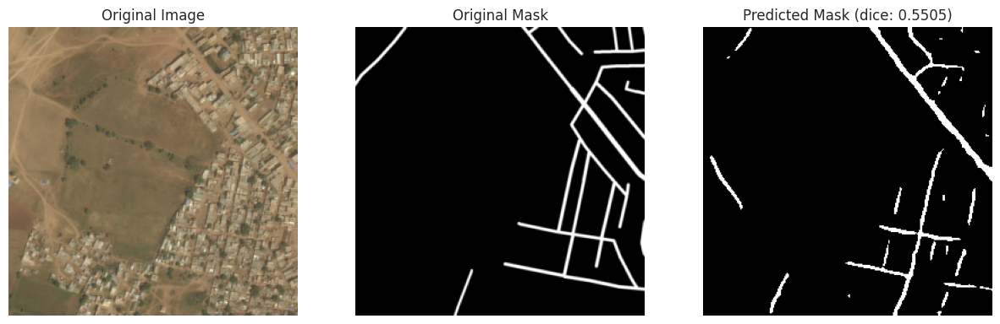

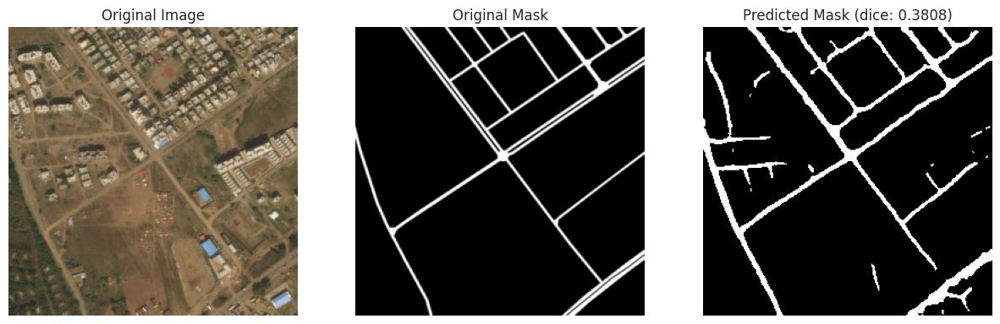

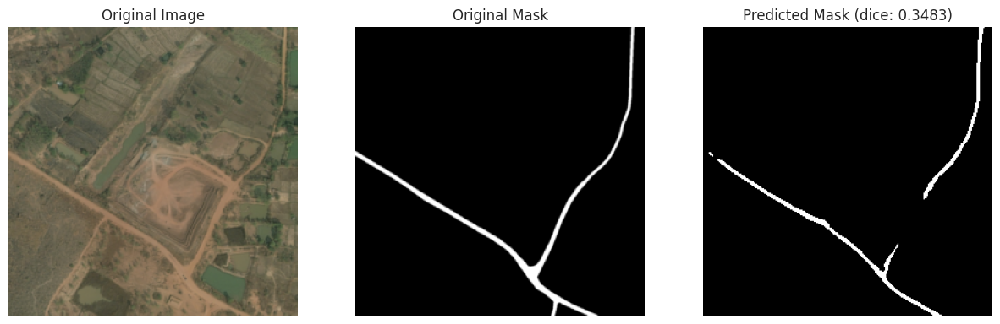

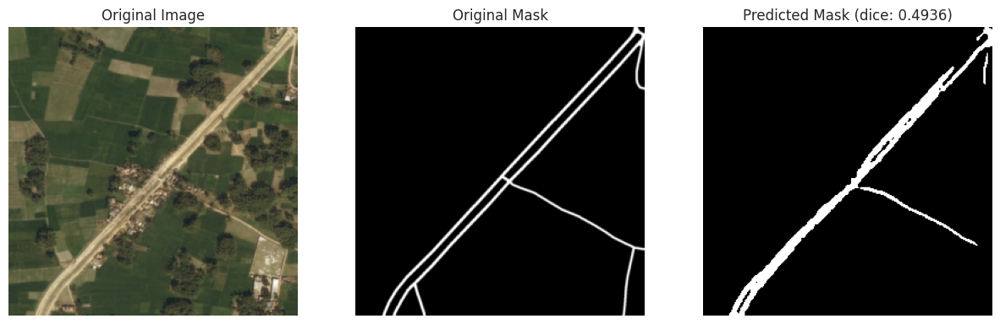

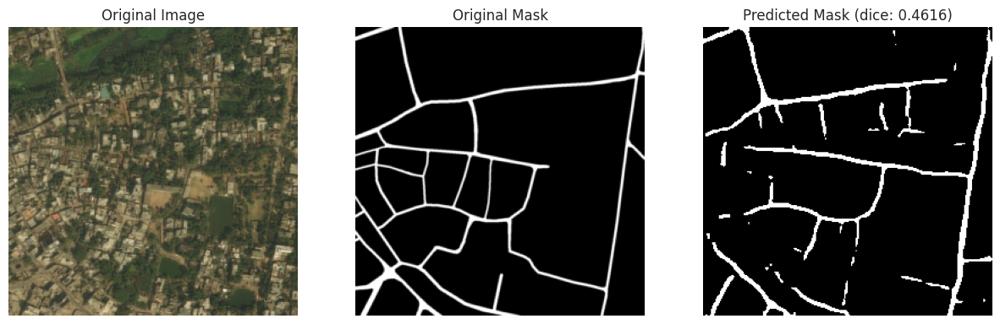

Средний dice: 0.4470


0.44695172

In [159]:
test_indices = random.sample(range(len(val_loader.dataset)), 5)
images = [val_loader.dataset[idx][0] for idx in test_indices]
masks = [val_loader.dataset[idx][1] for idx in test_indices]

evaluate_model_on_images(unet_model, images, masks, device='cuda')

Теперь DeepLab

In [34]:
def evaluate_model_on_images_deeplab(model, images, masks, device, num_classes=21):
    """
    Args:
        model: обученная модель DeepLab
        images: тензоры изображений [N, C, H, W] (уже нормализованные)
        masks: тензоры масок [N, H, W] (классы 0-20)
        device: 'cuda' или 'cpu'
        num_classes: количество классов
    """
    ious = []
    dices = []
    model = model.to(device)
    model.eval()

    with torch.no_grad():
        for img_tensor, mask_tensor in zip(images, masks):
            # Перемещаем данные на устройство
            img_tensor = img_tensor.unsqueeze(0).to(device)  # [1, C, H, W]
            mask_tensor = mask_tensor.to(device)  # [H, W] или [1, H, W]

            # Предсказание
            output = model(img_tensor)  # Извлекаем выходной тензор
            output = torch.sigmoid(output)  # Применяем сигмоиду для получения вероятностей
            pred = (output >= 0.5).cpu().squeeze()  # [1, H, W]

            # Расчет IoU
            iou = calculate_iou(pred.cpu(), mask_tensor.cpu())
            dice_loss = soft_dice_loss(pred.cpu(), mask_tensor.cpu())
            ious.append(iou)
            dices.append(dice_loss)

            # Визуализация
            fig, ax = plt.subplots(1, 3, figsize=(18, 6))
            
            # Денормализация изображения (если применялась при загрузке)
            img_vis = img_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
            # img_vis = img_vis * np.array([0.229, 0.456, 0.406]) + np.array([0.485, 0.456, 0.406])
            # img_vis = np.clip(img_vis, 0, 1)
            
            ax[0].imshow(img_vis)
            ax[0].set_title("Original Image")
            ax[0].axis('off')

            ax[1].imshow(mask_tensor.squeeze().cpu(), cmap='gray')
            ax[1].set_title("Ground Truth Mask")
            ax[1].axis('off')

            ax[2].imshow(pred.squeeze().cpu(), cmap='gray')
            ax[2].set_title(f"Predicted Mask (dice: {dice_loss:.4f})")
            ax[2].axis('off')

            plt.show()

    mean_iou = np.mean(ious)
    mean_dice = np.mean(dices)
    print(f"Mean dice: {mean_dice:.4f}")
    return mean_dice

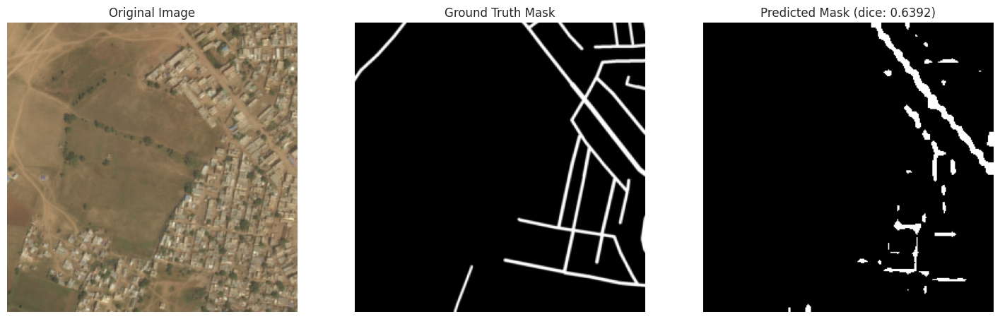

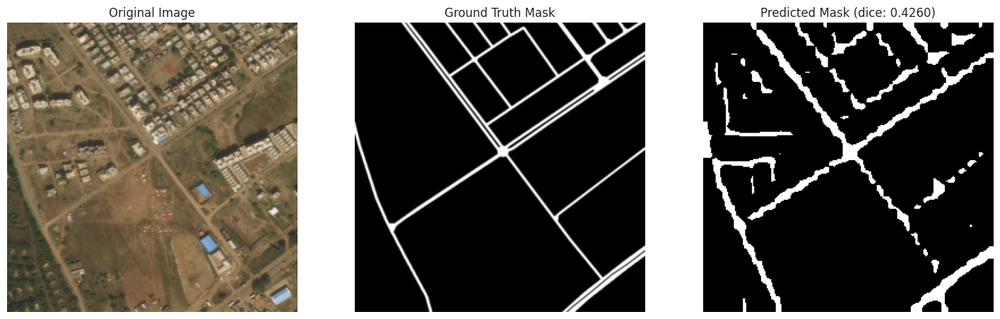

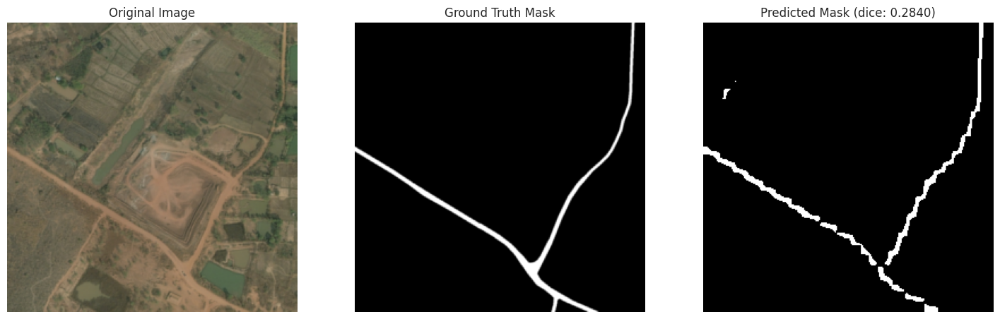

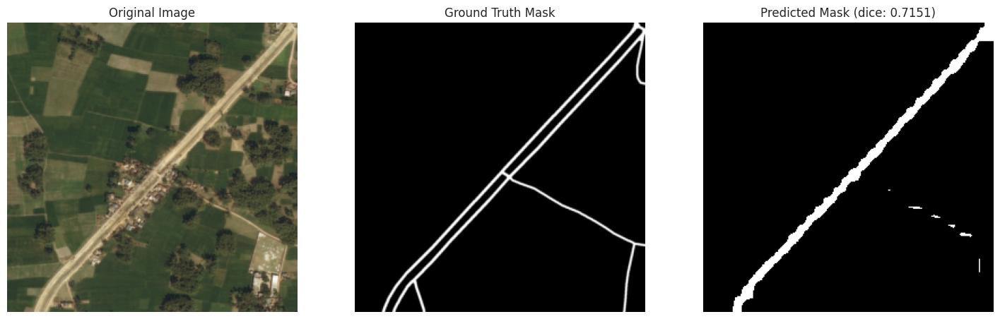

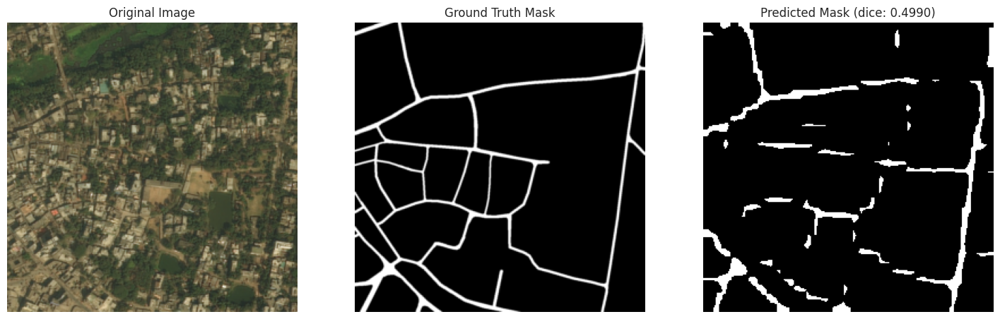

Mean dice: 0.5126


0.51263237

In [160]:
evaluate_model_on_images_deeplab(deeplab_model, images, masks, device='cuda')

Как видим, UNet имеет лучшее качество, его и будем использовать.

Посмотрим на полученные метрики.

True
True


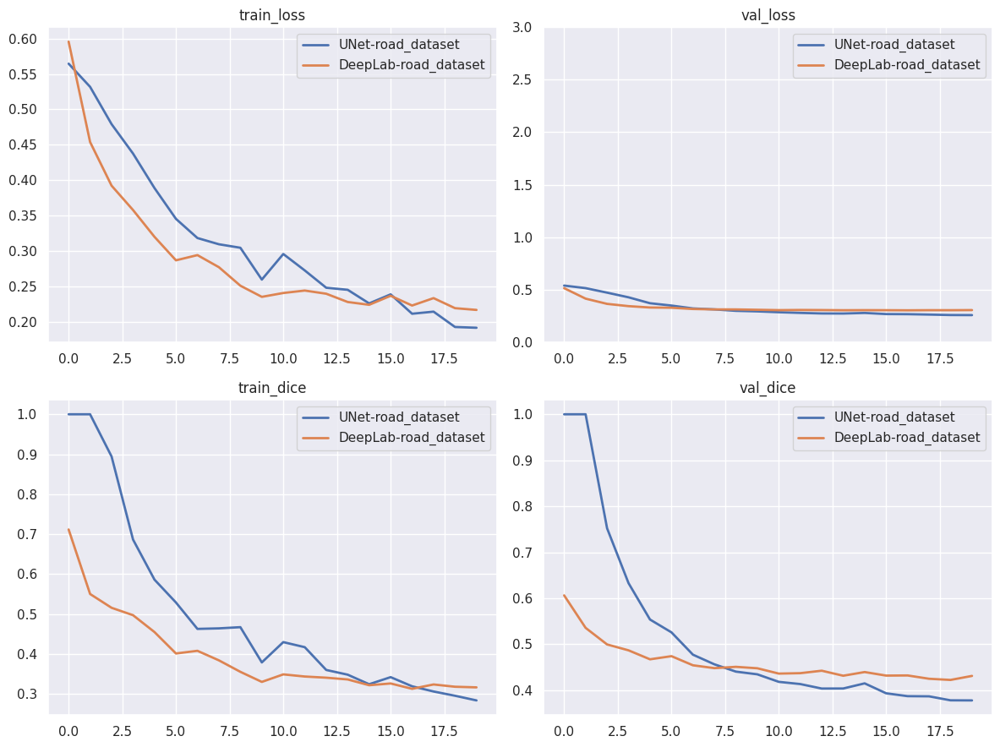

In [36]:
runs = wandb.Api().runs("cv_task")
subplot_names = np.array([['train_loss', 'val_loss'],
                          ['train_dice', 'val_dice']])
fig, axs = plt.subplots(2, 2, figsize=(12, 9))
lw = 2
for i, run in enumerate(runs):
    df = run.history().groupby('epoch').mean(numeric_only=True)
    for k in range(2):
        for m in range(2):
            axs[k, m].set_title(subplot_names[k, m])
            axs[k, m].plot(df[subplot_names[k, m]], lw=lw, label=run.name)
            axs[k, m].legend()
    axs[0, 1].set_ylim((0, 3))
plt.tight_layout()

3. Применим нашу модель к Долгопрудному, и посмотрим, что выйдет

In [37]:
dolgopa_path = "/kaggle/input/dolgopa/dolgopa/dolgopa"
images = sorted(glob(dolgopa_path + '/*.jpg'))

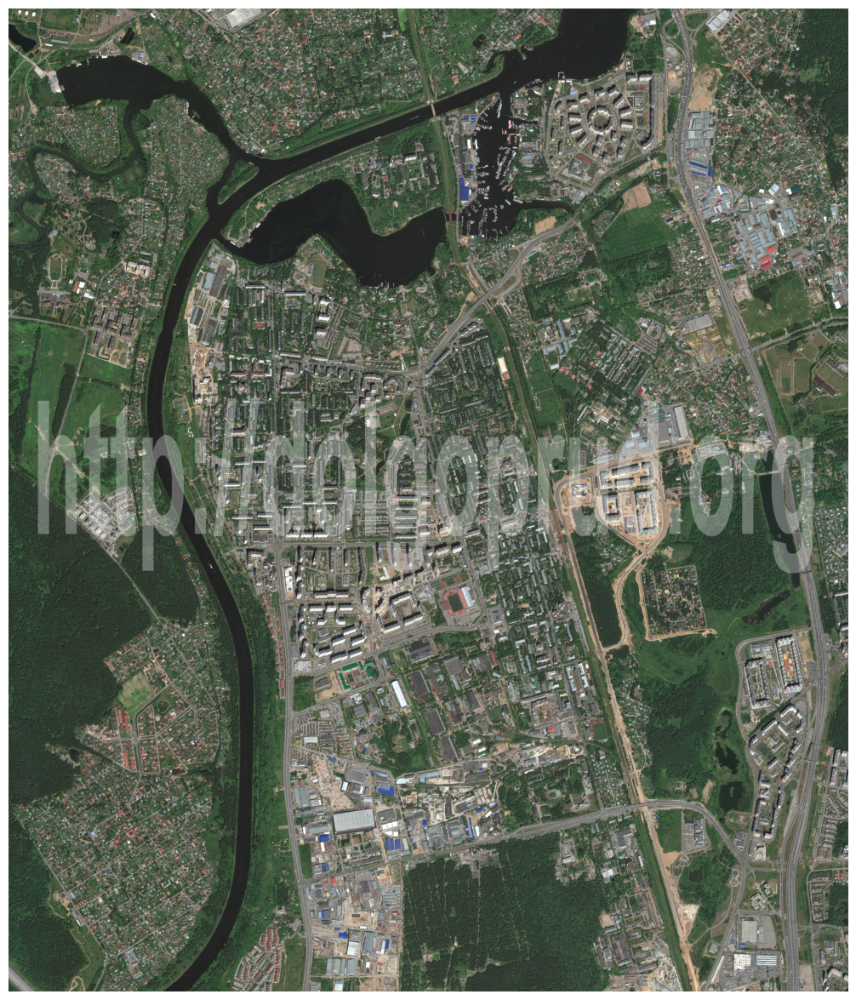

In [38]:
img = Image.open("/kaggle/input/dolgopa/dolgoprudny.jpg")

# Создаем фигуру
plt.figure(figsize=(15, 15))

# Отображаем изображение
plt.imshow(img)
plt.axis("off")  # Убираем оси
plt.show()

Применим модель.

In [ ]:
output_dir = "predicted_masks"
os.makedirs(output_dir, exist_ok=True)

# Регулярное выражение для извлечения координат x, y из пути файла
tile_pattern = re.compile(r"tile_(\d+)_(\d+)\.jpg")

def extract_tile_coords(file_name):
    """Извлекает координаты (x, y) из имени файла."""
    match = tile_pattern.search(file_name)
    if match:
        return tuple(map(int, match.groups()))
    else:
        raise ValueError(f"Ошибка разбора имени файла: {file_name}")

def apply_model_and_save_masks(model, image_paths, device):
    """
    Применяет модель к изображениям, сохраняет предсказанные маски с правильными именами.

    :param model: сегментационная модель
    :param image_paths: список путей к изображениям тайлов
    :param device: устройство для вычислений ('cuda' или 'cpu')
    :return: массив предсказанных масок
    """
    # Сортируем пути файлов по координатам (x, y)
    image_paths = sorted(image_paths, key=lambda p: extract_tile_coords(p))

    predicted_masks = []

    model.to(device)
    model.eval()

    with torch.no_grad():
        for img_path in image_paths:
            # Загружаем изображение и преобразуем в тензор
            img = Image.open(img_path).convert("RGB")
            img_tensor = torch.tensor(np.array(img) / 255.0).permute(2, 0, 1).unsqueeze(0).to(device)

            # Пропускаем через модель
            output = model(img_tensor.float())

            if isinstance(output, dict) and 'out' in output:
                output = output['out']

            output = torch.sigmoid(output)
            pred_mask = (output >= 0.3).cpu().squeeze().numpy()  # Бинаризуем

            # Сохраняем маску в список
            predicted_masks.append(pred_mask)

            # Извлекаем координаты из имени файла
            x, y = extract_tile_coords(img_path)

            # Сохраняем маску как изображение
            mask_img = Image.fromarray((pred_mask * 255).astype(np.uint8))
            mask_img.save(os.path.join(output_dir, f"mask_{x}_{y}.jpg"))

    # Сохраняем массив масок
    predicted_masks = np.array(predicted_masks)
    np.save(os.path.join(output_dir, "predicted_masks.npy"), predicted_masks)

    print(f"Сохранено {len(predicted_masks)} масок в {output_dir}/")

    return predicted_masks

In [41]:
# Применяем модель
predicted_masks = apply_model_and_save_masks(unet_model, images, device='cuda')

Сохранено 437 масок в predicted_masks/


Сошьем маски, и посмотрим на результат.

In [42]:
def stitch_tiles(output_folder, tile_size=256, overlap=64, output_path='/kaggle/working/stitched_dolgopa.jpg'):
    # Получаем список файлов с масками
    tile_files = sorted([f for f in os.listdir(output_folder) if f.endswith('.jpg')])

    if not tile_files:
        print("No tiles found in the specified folder.")
        return

    # Вычисляем количество тайлов в каждой размерности
    x_tiles = max(int(f.split('_')[1]) for f in tile_files) + 1
    y_tiles = max(int(f.split('_')[2].split('.')[0]) for f in tile_files) + 1

    # Создаем пустое изображение для сшивания
    stitched_image = Image.new('RGB', (x_tiles * (tile_size - overlap) + overlap, 
                                       y_tiles * (tile_size - overlap) + overlap))

    # Вставляем каждый тайл в нужную позицию
    for tile_file in tile_files:
        x = int(tile_file.split('_')[1])
        y = int(tile_file.split('_')[2].split('.')[0])
        tile = Image.open(os.path.join(output_folder, tile_file))
        stitched_image.paste(tile, (x * (tile_size - overlap), y * (tile_size - overlap)))

    # Сохраняем сшитое изображение
    stitched_image.save(output_path)
    print(f"The image has been stitched and saved successfully at {output_path}.")

stitch_tiles(output_folder="/kaggle/working/predicted_masks")

The image has been stitched and saved successfully at /kaggle/working/stitched_dolgopa.jpg.


Теперь выведем полученное изображение и фото Долгопрудного.

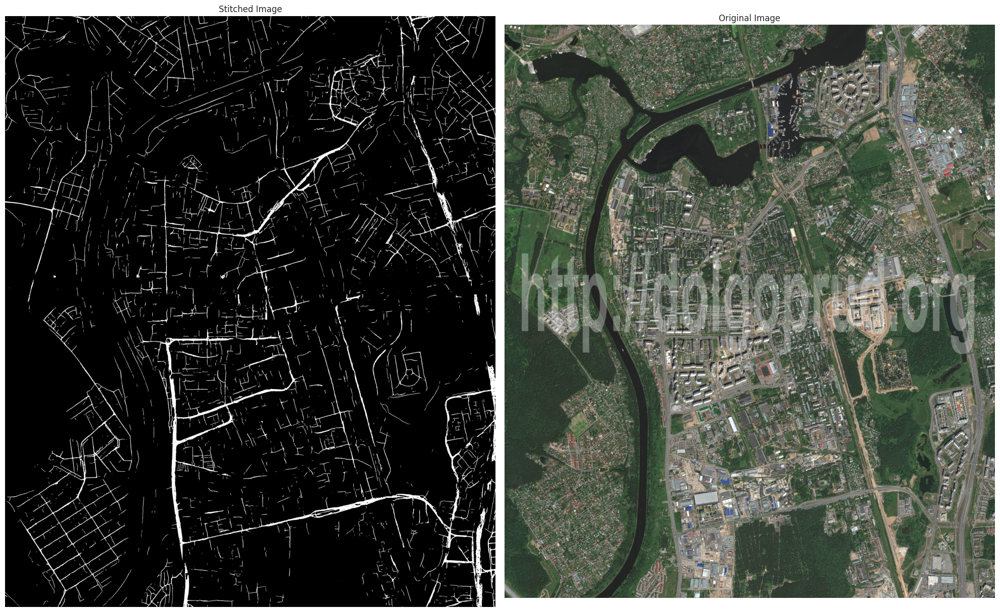

In [43]:
img1 = Image.open("/kaggle/working/stitched_dolgopa.jpg")
img2 = Image.open("/kaggle/input/dolgopa/dolgoprudny.jpg")

fig, axes = plt.subplots(1, 2, figsize=(20, 15))

# Отображаем первое изображение
axes[0].imshow(img1)
axes[0].set_title("Stitched Image")
axes[0].axis("off")

# Отображаем второе изображение
axes[1].imshow(img2)
axes[1].set_title("Original Image")
axes[1].axis("off")

# Показываем результат
plt.tight_layout()
plt.show()

**Выводы**

Как видим, получилась вполне полная картра дорог Долгопрудного. Для улучшения качества возможно стоило проварьировать трешхолд для сигмоиды, но даже так получилось вполне достойно -- видны основные магистрали, и например дороги в дачных поселках. Также не сложно выделить Первомайскую.

### Часть 3. Детекция объектов на дороге 🚗👫🚲

Современные системы помощи водителю и автономного вождения должны надежно распознавать различные объекты на дороге: от других участников движения до элементов дорожной инфраструктуры. В этой части вы создадите систему детекции пяти ключевых типов объектов: автомобилей, пешеходов, велосипедистов/мотоциклистов, дорожных знаков и светофоров.

#### Этапы работы

1. **Сбор данных.** Как и в первой части предлагается использовать несколько датасетов, например:
    - [Traffic Road Object Detection Polish 12k](https://www.kaggle.com/datasets/mikoajkoek/traffic-road-object-detection-polish-12k),
    - [Mapillary Vistas Image Data Collection](https://www.kaggle.com/datasets/kaggleprollc/mapillary-vistas-image-data-collection),
    - [N_O_1 Computer Vision Project](https://universe.roboflow.com/dice-6h29i/n_o_1),
    - [N_O_2 Computer Vision Project](https://universe.roboflow.com/nada-majd-e4uhb/n_o_2),
    - Любые другие подходящие датасеты по вашему выбору.

2. **Подготовка данных**
    - Проанализируйте классы в каждом датасете.
    - Скорее всего наборы классов в разных датасетах будут отличаться. Сделайте маппинг в необходмые нам 5 классов:
        * Объедините классы одинаковых объектов (например, `Green-Traffic-Light` и `Red-Traffic-Light`);
        * Отфильтруйте ненужные классы.

3. **Эксперименты с моделями.** Проведите различные эксперименты по обучению моделей, попробуйте разные архитектуры, например:
    - YOLO,
    - RetinaNet,
    - SSD,
    - Любые другие архитектуры по вашему выбору.

    Как и в части 1 рекомендуется логировать процесс обучения, примеры предсказаний и результаты в wandb/etc.


#### Бонус (альтернативный путь)
После прочтения условия 4 части, возможно у вас появится желание обучить специальную модель детекции для работы с видео, чтобы движение боксов было наиболее плавным и точным. Вы можете пойти по этому пути, но тогда вам потребуется самостоятельно:
- Найти подходящие видео-датасеты, содержащие разметку на хотя бы 4 класса: автомобили, пешеходы, дорожные знаки и светофоры;
- Изучить принципы работы и обучения моделей детекции и трекинга объектов на видео.

Если получится добиться хорошего качества модели трекинга объектов на видео, вы получите +20 бонусных баллов.


### Часть 4. Пайплайн применения модели детекции для анализа видео 🎥🔍

В этой части предлагается сделать видео с демонстрацией работы модели из предыдущей части в реальных условиях.

#### Этапы работы

1. **Сбор данных**
    - Вариант 1 (рекомендуемый): запишите видео дороги в Долгопрудном, например, ваш путь до Мираторга, Дирижабля или 13/14 общежитий.
    - Вариант 2: если по каким-то причинам самому снять видео не получается, разрешается взять любое видео с камеры автомобиля из youtube.

2. **Применение моделей.** К каждому кадру примените обученную модель детекции из части 3.

3. **Визуализация.** Отобразите на каждом кадре предсказанные боксы и их классы. Затем склейте их обратно в видео.

4. **Стабилизация боксов.** Скорее всего качество полученного видео вас не устроит, так как боксы будут дрожать из-за подрешностей в предсказаниях между соседними кадрами. Для этого предлагается реализовать сглаживание боксов детекций. Например, можно попробовать экспоненциальное скользящее среднее для координат боксов.

*Совет.* В этой части крайне приветствуется использование LLM для:
- Написания и оптимизации кода;
- Идей по красивой визуализации боксов и подписей;
- Идей для решения технических проблем, особенно со стабилизацией в 4 пункте.

Полученное видео загрузите на диск и прикрепите ссылку на него.
